# Power spectral density of seizeure vs. non-seizure 

In [1]:
COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
         '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
from scipy import signal

class EEG_sample:
    def __init__(self, file, seizure_times, window_before=100, window_after=50):
        self.file = file
        self.raw = mne.io.read_raw_edf(file)
        self.raw_data = self.raw.get_data()
        # you can get the metadata included in the file and a list of all channels:
        self.info = self.raw.info
        self.channels = self.raw.ch_names
        self.fs = 256
        self.seizure_time = seizure_times
        self.window_before = window_before
        self.window_after = window_after


    def plot_part_of_signal(self, n_channels):
        '''
        Plots an EEG signal for only n_channels sources.
        :param time: int, sec of signal to plot
        :param n_channels: int
        :return: None
        '''
        assert n_channels < len(self.channels)
        signal_len = self.seizure_time[1] + self.window_after - (self.seizure_time[0] - self.window_before)
        time_ = np.linspace(self.seizure_time[0] - self.window_before, self.seizure_time[1] + self.window_after, signal_len*self.fs)
        
        fig = plt.figure(figsize=(10*n_channels, 40))
        start = (self.seizure_time[0] - self.window_before)*self.fs
        stop = (self.seizure_time[1] + self.window_after)*self.fs
        
        for i in range(n_channels):
            plt.subplot(n_channels,1, i+1)
            plt.plot(time_, self.raw_data[i][start:stop], COLORS[i], label=self.channels[i])
            plt.title('EEG channel '+str(self.channels[i]), weight='bold', fontsize=25)
            
            plt.xlabel('Time, s', fontsize=18)
            plt.ylabel('Signal, V', fontsize=18)
            plt.legend(fontsize='xx-large')
        return plt.show()
    
    def get_average_throght_channels(self):
        self.average_throgh_all_channels = []
        for col in range(self.raw_data[0]):
            avg_cols = []
            
            for ch in range(self.raw_data):
                avg_cols.append(self.raw_data[ch][col])
                
            self.average_throgh_all_channels.append(sum(avg_cols)/len(avg_cols))
            
    def plot_spectrogram(self, chans = [1,2]):
        
        for ch in chans:
            sp = signal.spectrogram(s, fs =self.fs, window='blackman', nperseg = int(0.2*self.fs))
            f, t, Sxx = sp
            fig= plt.figure(figsize=(30,9))
            plt.pcolormesh(t, f, Sxx, shading='gouraud')
            plt.ylabel('Frequency [Hz]')
            plt.xlabel('Time [sec]')
            plt.title('Spectrogram of '+self.channels[ch], weight='bold', fontsize=20)
        
        return plt.show()
            
            

In [2]:
import mne
import matplotlib.pyplot as plt
import numpy as np
file = "./test_data/chb01_03/chb01_03.edf"
seizure_time = [2996, 3036]

sample = EEG_sample(file, seizure_time)

Extracting EDF parameters from /Users/sofiyagarkot/Desktop/Signals/coursework/test_data/chb01_03/chb01_03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-1-be0bfaf92afa>:8: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  self.raw = mne.io.read_raw_edf(file)


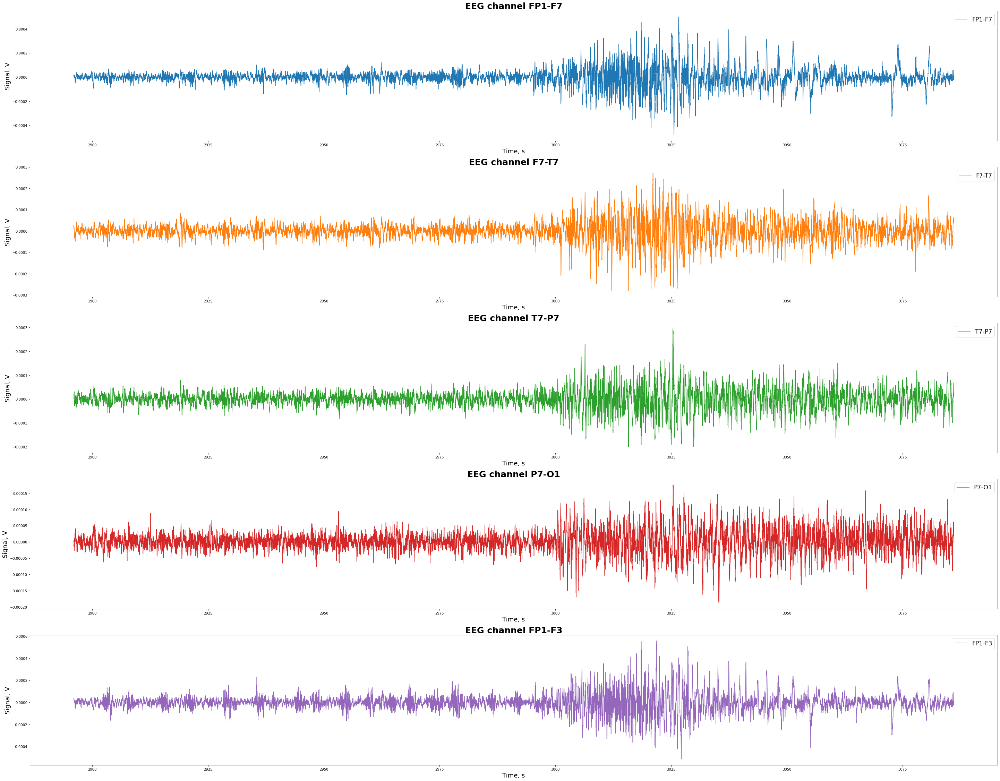

In [3]:
sample.plot_part_of_signal(5)

# Power spectral density

In [4]:
from scipy import signal

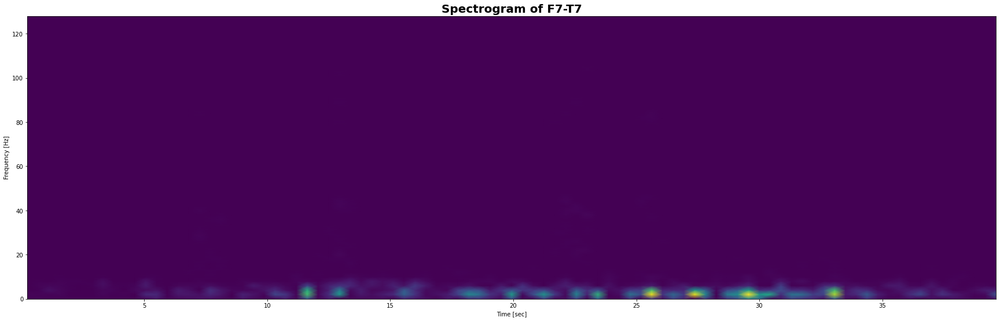

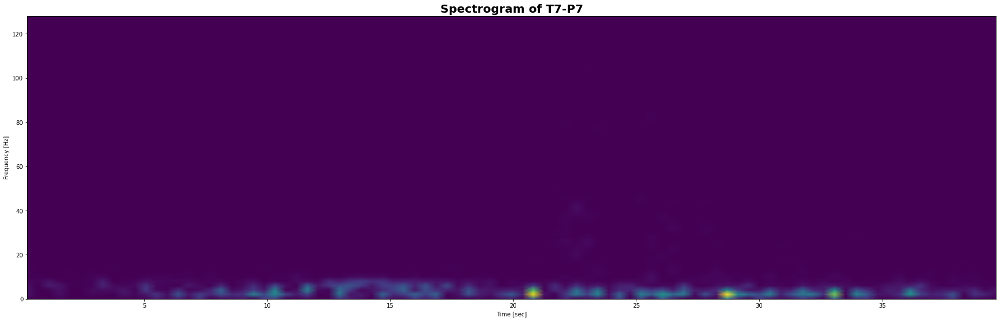

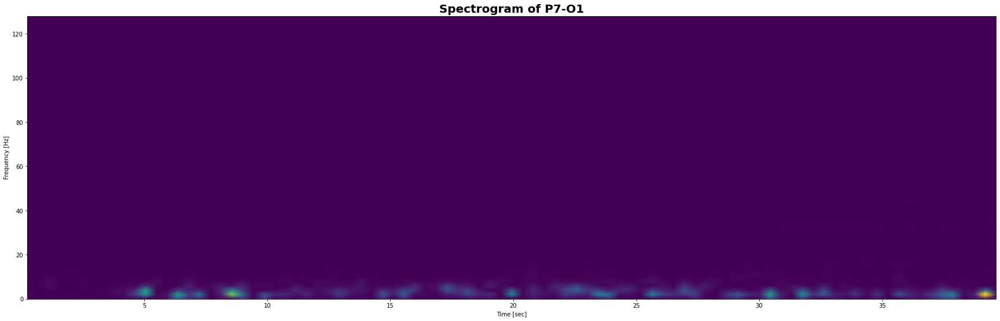

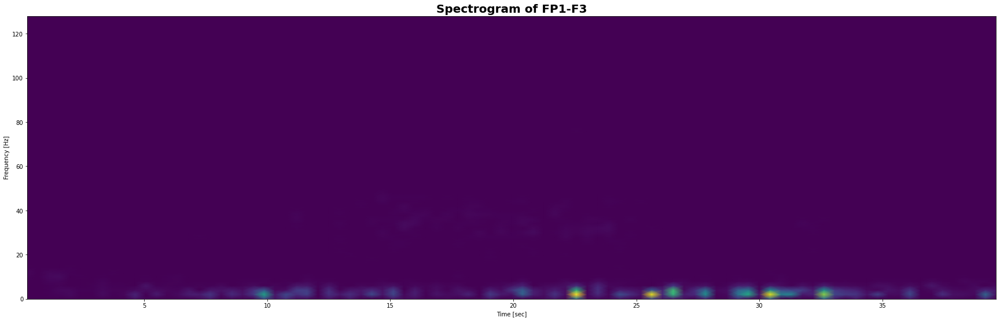

In [5]:
chans = [1,2,3,4]
for ch in chans:
    boundaries = [sample.seizure_time[0]*sample.fs, sample.seizure_time[1]*sample.fs]
    sp = signal.spectrogram(sample.raw_data[ch][boundaries[0]:boundaries[1]], fs = sample.fs, window='blackman', nperseg = int(0.5*sample.fs))
    f, t, Sxx = sp
    fig= plt.figure(figsize=(30,9))
    plt.pcolormesh(t, f, Sxx, shading='gouraud')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.title('Spectrogram of '+sample.channels[ch], weight='bold', fontsize=20)
        
    plt.show()
    

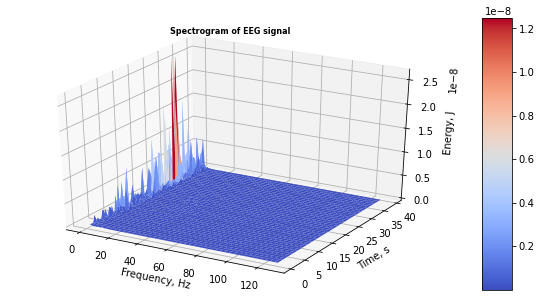

In [6]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.collections import PolyCollection
boundaries = [sample.seizure_time[0]*sample.fs, sample.seizure_time[1]*sample.fs]
mysignal = sample.raw_data[0][boundaries[0]:boundaries[1]]


f, t, Sxx = signal.spectrogram(mysignal, fs = sample.fs)

fig = plt.figure(figsize=(10,5))
ax = fig.gca(projection='3d')
ax.set_xlabel('Frequency, Hz')
ax.set_ylabel('Time, s')
ax.set_zlabel('Energy, J')
surf = ax.plot_surface(f[:, None], t[None, :], Sxx, cmap=cm.coolwarm)
fig.colorbar(surf, aspect=9)

plt.title("Spectrogram of EEG signal", weight='bold', fontsize=8)
plt.show()

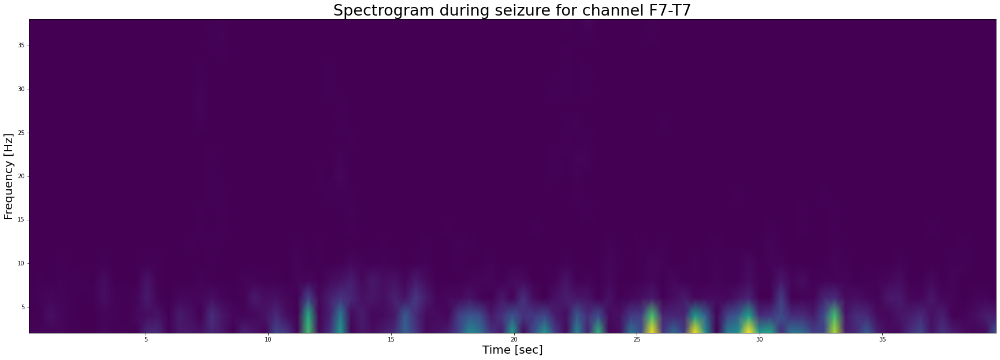

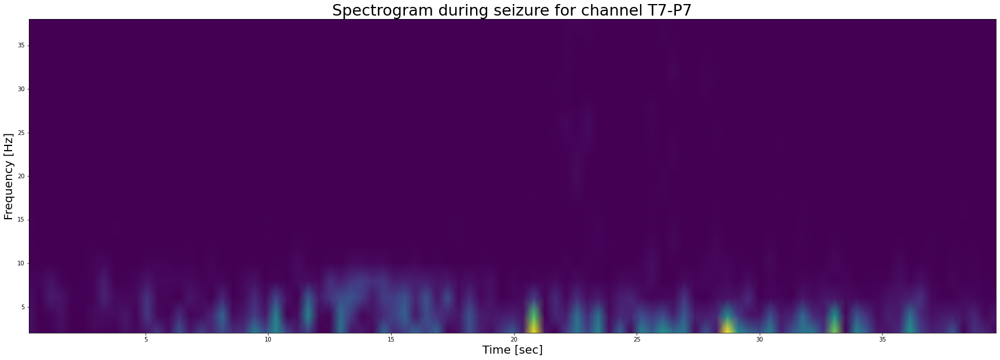

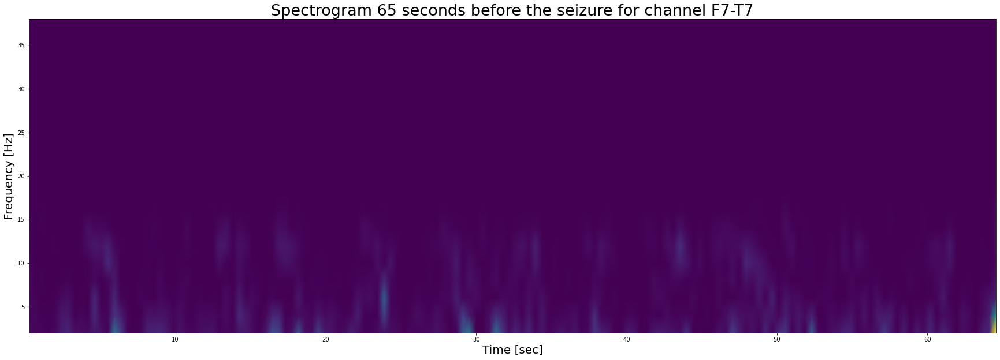

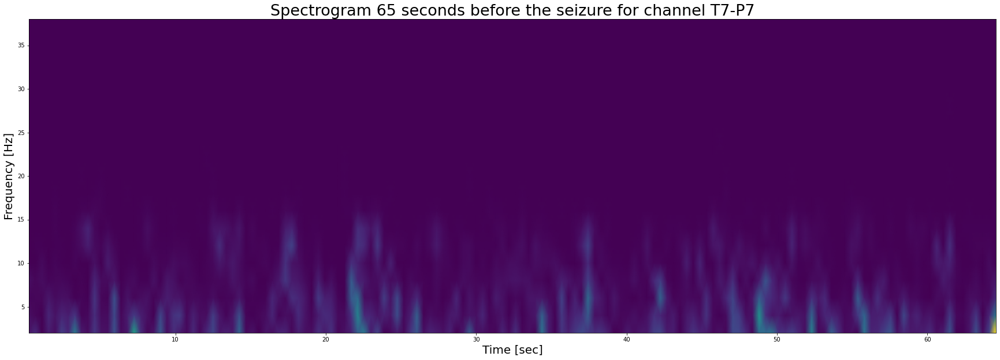

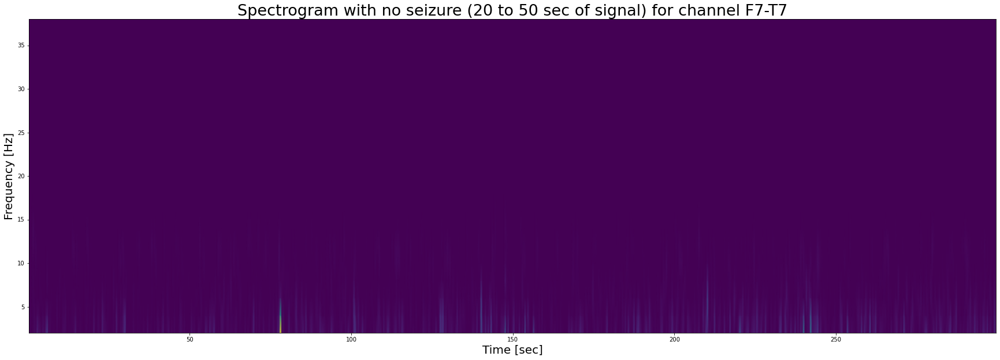

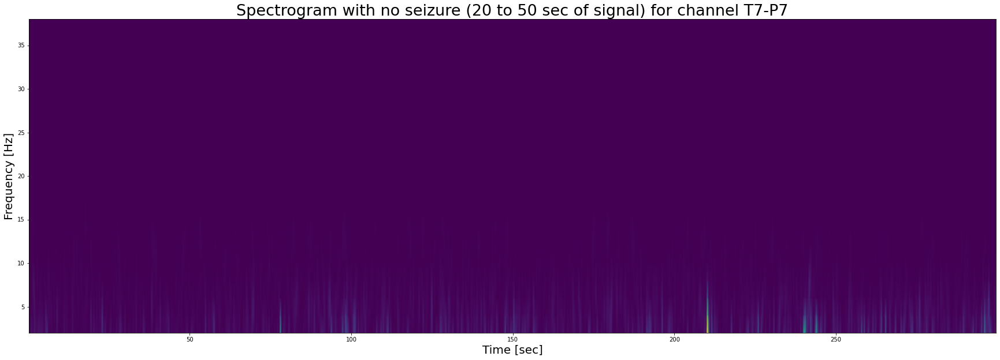

In [9]:
def build_spectrogram(mysignal, t1, t2, f1, f2, sampling_freq, window, nperseg, noverlap, title='Spectrogram between the 0 and 20'):
    
    f, t, Sxx = signal.spectrogram(mysignal, sampling_freq, window=window, nperseg = nperseg, noverlap = noverlap)


    myfilter = (f<f2) & (f>f1)
    myfiltert = (t<t2) & (t>t1)
    f = f[myfilter]
    t = t[myfiltert]
    Sxx = Sxx[myfilter, ...]
    Sxx = Sxx[..., myfiltert]


    fig= plt.figure(figsize=(30,10))
    plt.pcolormesh(t[None, :], f[:, None], Sxx, shading='gouraud')
    plt.ylabel('Frequency [Hz]', fontsize=20)
    plt.xlabel('Time [sec]', fontsize=20)
    plt.title(title, fontsize=27)
#     plt.title('Spectrogram of a signal with ' + window + ' window = ' + str(round(nperseg/sampling_freq, 2))+' sec, '+str(round( (noverlap/sampling_freq)/nperseg, 2))+' length of window overlap', weight='bold', fontsize=27)
    plt.show()
    
chans = [1,2]
for ch in chans:
    boundaries = [sample.seizure_time[0]*sample.fs, sample.seizure_time[1]*sample.fs]
    my_signal = sample.raw_data[ch][boundaries[0]:boundaries[1]]
    fs = sample.fs
    window='blackman'
    noverlap = None
    nperseg = int(0.5*sample.fs)
    build_spectrogram(my_signal, 0, len(my_signal)//sample.fs, 0, 40, fs, window, nperseg, noverlap, title='Spectrogram during seizure for channel '+str(sample.channels[ch]))
    
chans = [1,2]
for ch in chans:
    boundaries = [(sample.seizure_time[0]-65)*sample.fs,sample.seizure_time[0]*sample.fs]
    my_signal = sample.raw_data[ch][boundaries[0]:boundaries[1]]
    fs = sample.fs
    window='blackman'
    noverlap = None
    nperseg = int(0.5*sample.fs)
    build_spectrogram(my_signal, 0, len(my_signal)//sample.fs, 0, 40, fs, window, nperseg, noverlap, title='Spectrogram 65 seconds before the seizure for channel '+str(sample.channels[ch]))
    
    
chans = [1,2]
for ch in chans:
    boundaries = [200*sample.fs,500*sample.fs]
    my_signal = sample.raw_data[ch][boundaries[0]:boundaries[1]]
    fs = sample.fs
    window='blackman'
    noverlap = None
    nperseg = int(0.5*sample.fs)
    build_spectrogram(my_signal, 0, len(my_signal)//sample.fs, 0, 40, fs, window, nperseg, noverlap, title='Spectrogram with no seizure (20 to 50 sec of signal) for channel '+str(sample.channels[ch]))
    
    

We see that most of the energy is located between 5 and 20 frequencies. In orger to avoid noise I will aply a bandpass filter (0.5, 40) 

# Filtered

In [58]:
copy_of_data = sample.raw.copy()
copy_of_data = copy_of_data.load_data().filter(l_freq=0.5, h_freq=40).get_data()
print(type(copy_of_data))

Reading 0 ... 921599  =      0.000 ...  3599.996 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (6.605 sec)

<class 'numpy.ndarray'>


In [59]:
copy_of_data.shape, sample.raw_data.shape

((23, 921600), (23, 921600))

Filtered min and max -0.00048530847467289327 0.0004982244239569824
Original min and max -0.00047999999999999996 0.0004995360195360195


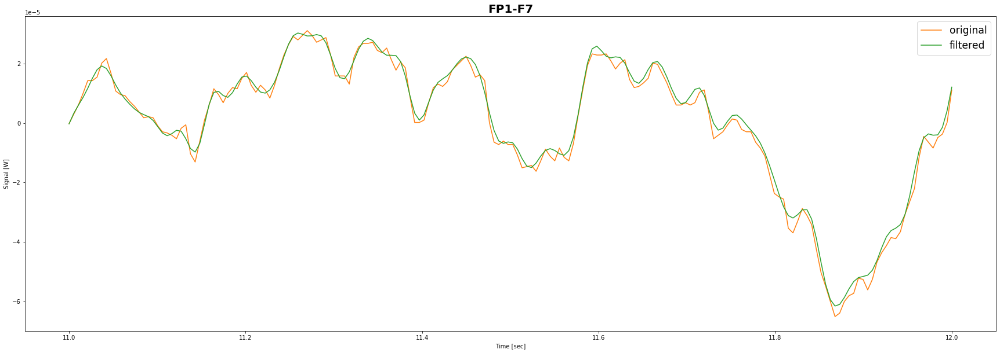

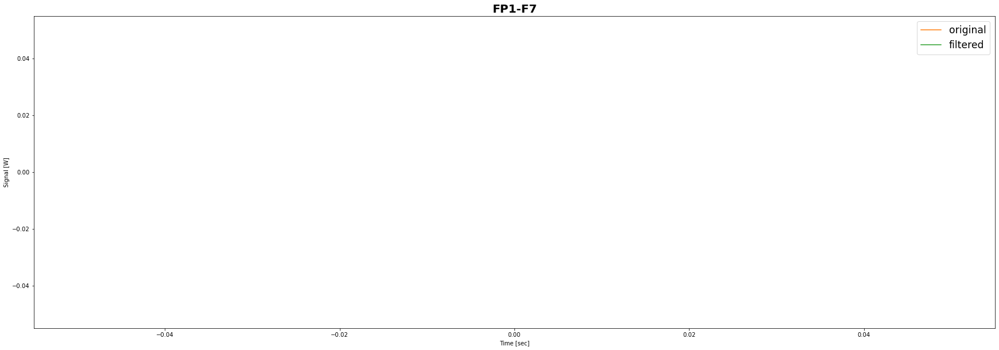

time length 48640


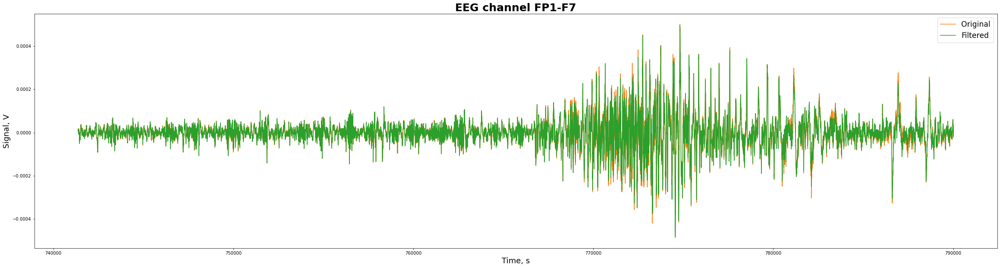

Filtered min and max -0.00027876837941889126 0.00029542217286605854
Original min and max -0.0002819047619047619 0.0003057387057387057


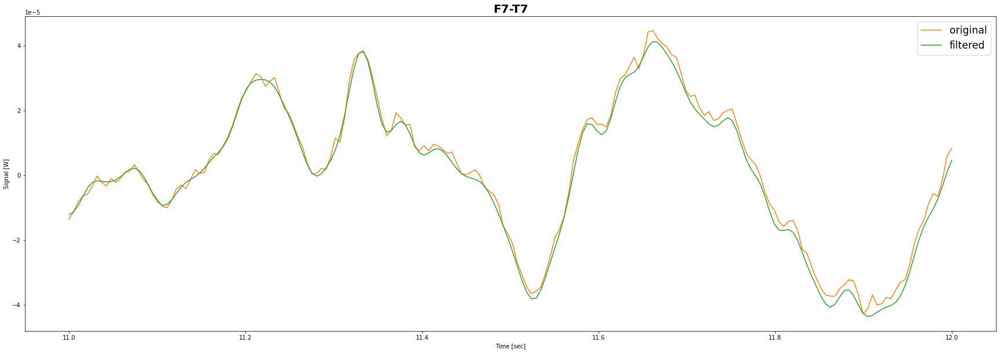

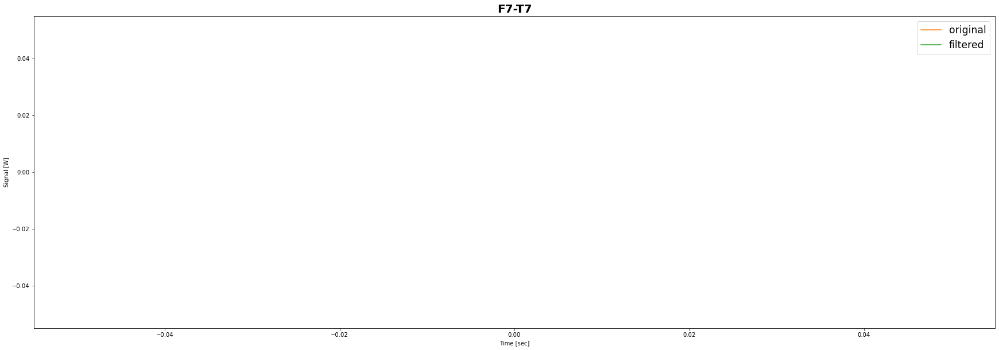

time length 48640


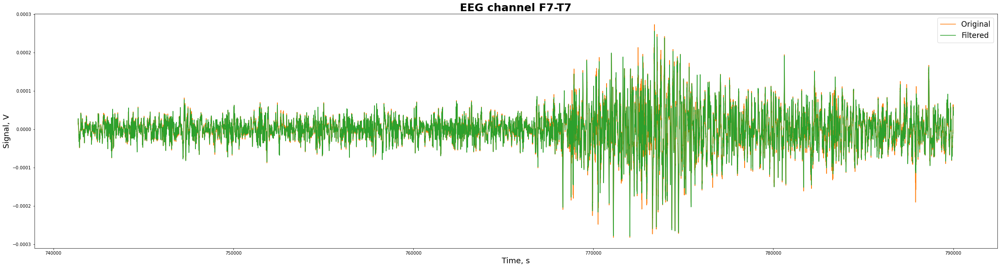

Filtered min and max -0.000311440279009389 0.00030099002577303914
Original min and max -0.000313943833943834 0.0003096459096459096


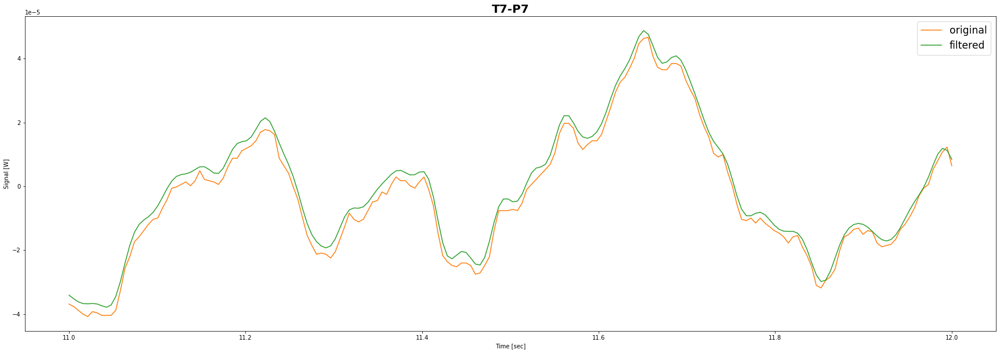

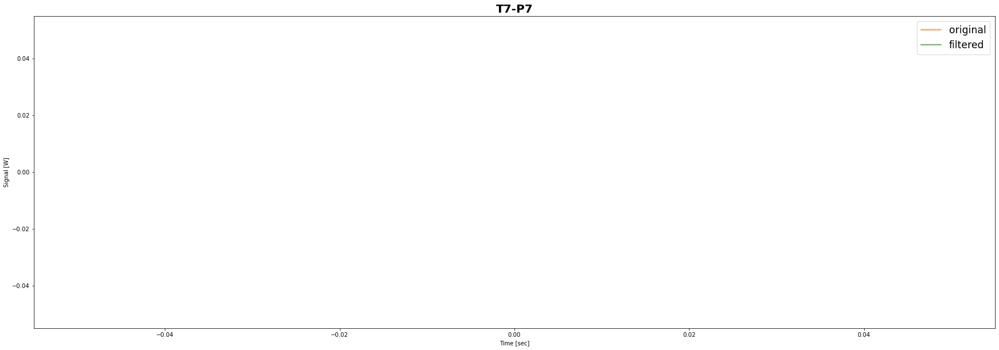

time length 48640


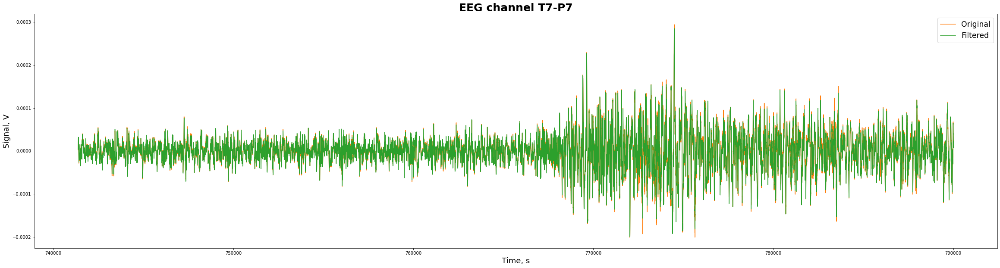

Filtered min and max -0.00020633650121820068 0.00019972637418886046
Original min and max -0.00020571428571428572 0.00019868131868131867


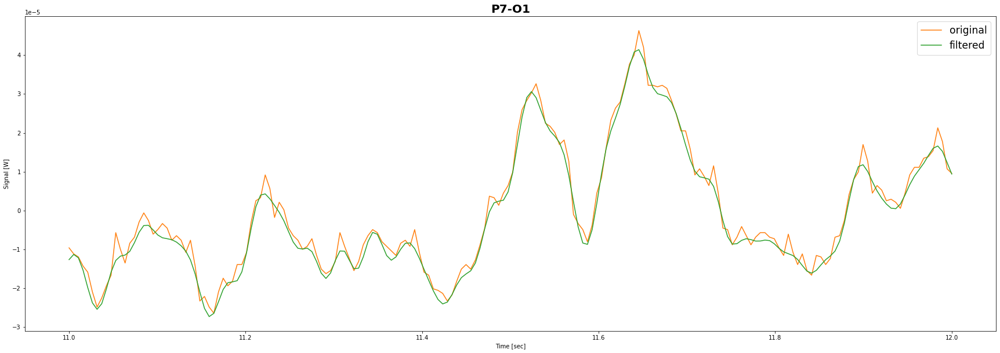

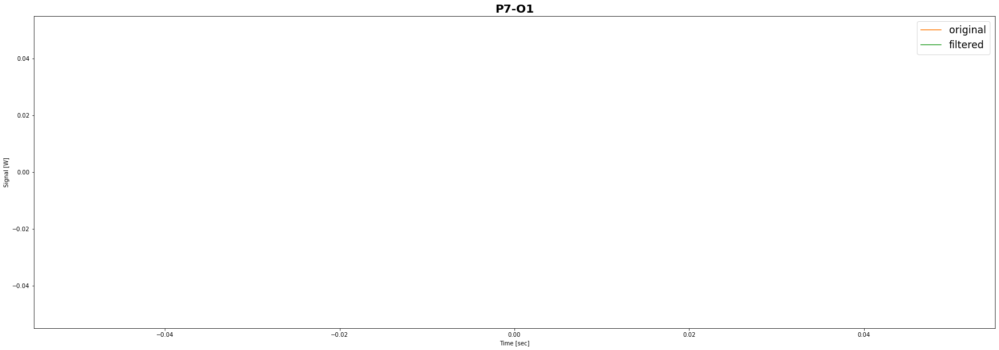

time length 48640


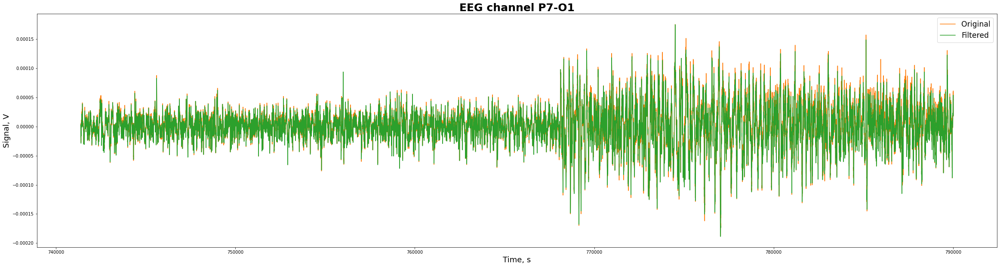

Filtered min and max -0.0005096356589453289 0.0005505190582570668
Original min and max -0.0005132112332112332 0.0005565811965811965


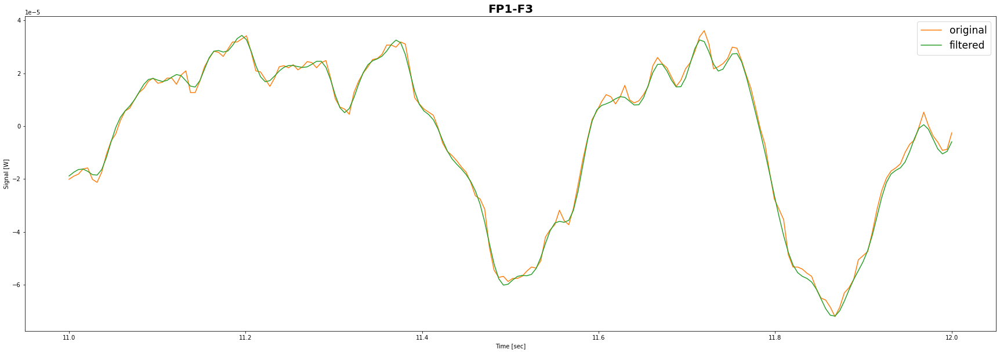

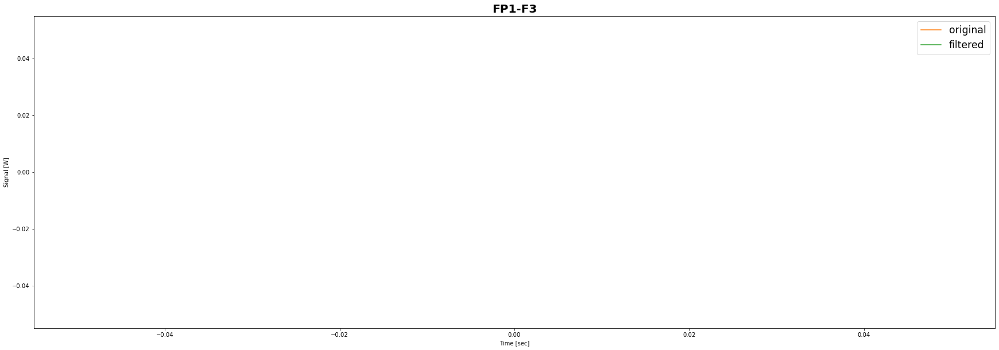

time length 48640


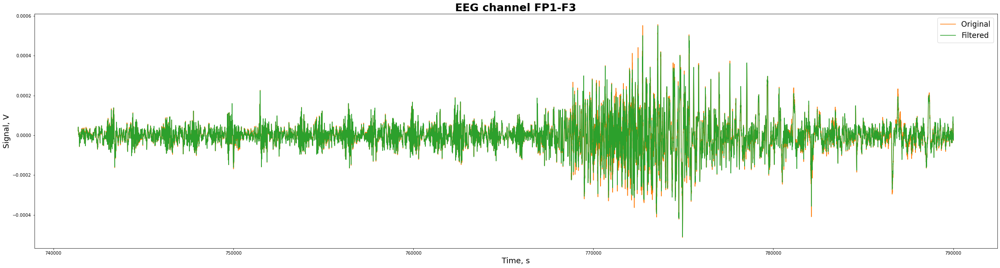

Filtered min and max -0.0004270999104817904 0.00035517332721012794
Original min and max -0.0004311599511599511 0.00034949938949938947


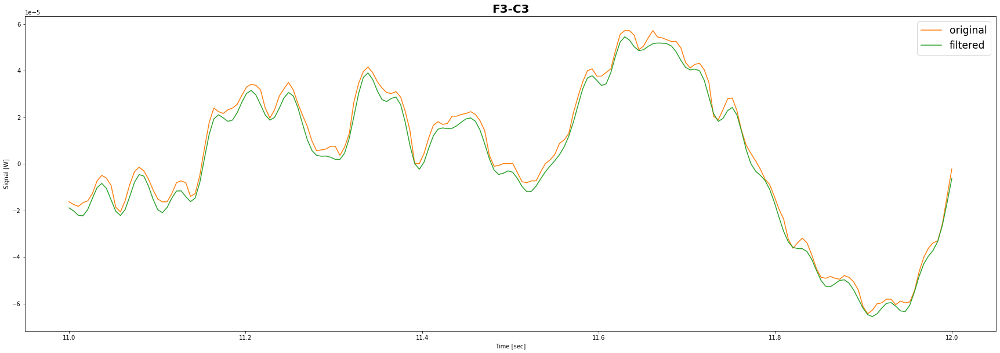

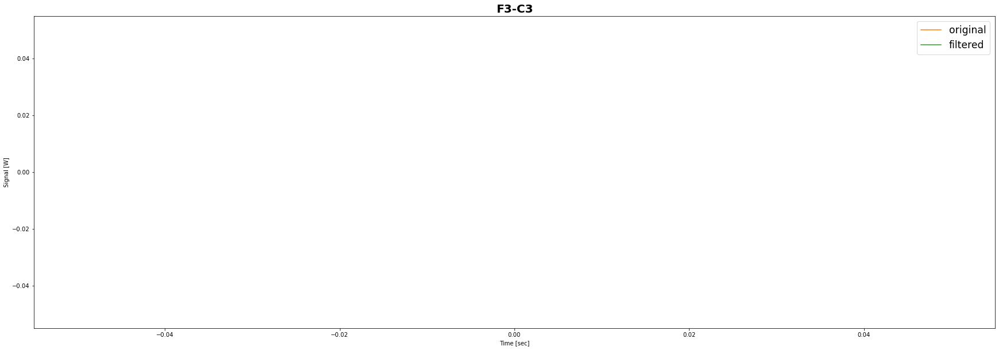

time length 48640


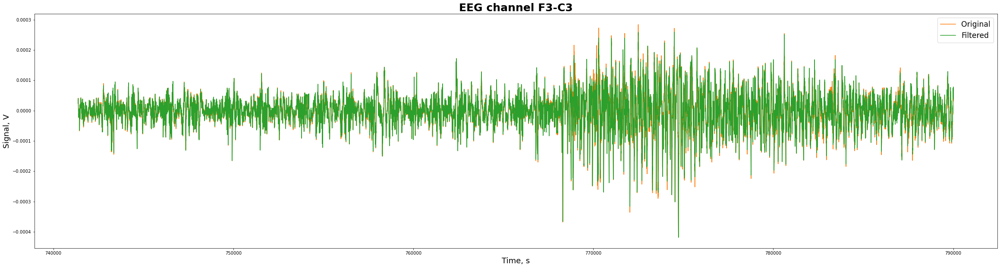

Filtered min and max -0.000316545700320619 0.00036235206744244565
Original min and max -0.00031667887667887666 0.00036317460317460316


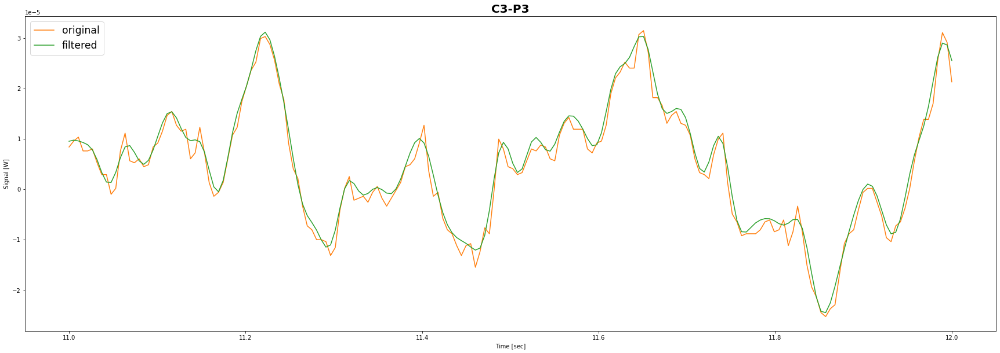

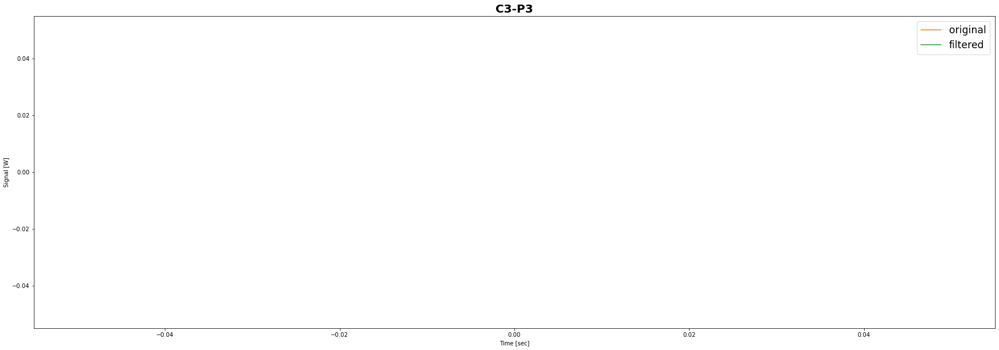

time length 48640


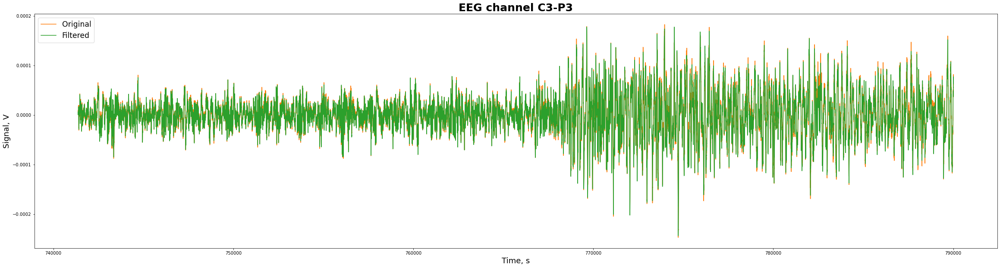

Filtered min and max -0.00037278601922749466 0.00031961100511225174
Original min and max -0.0003862271062271062 0.0003432478632478632


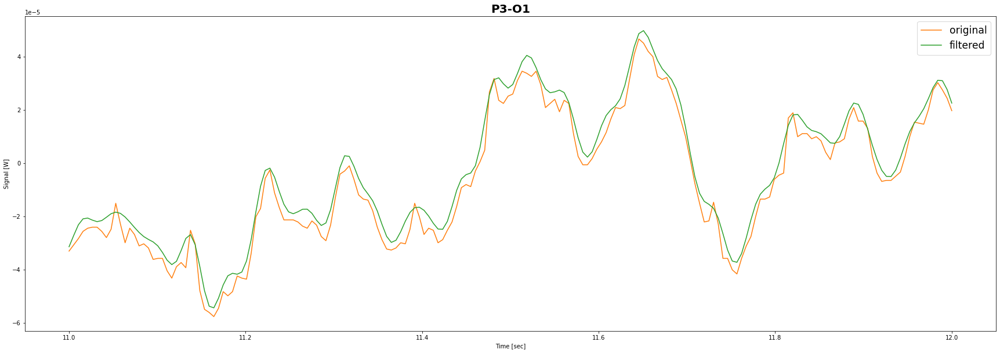

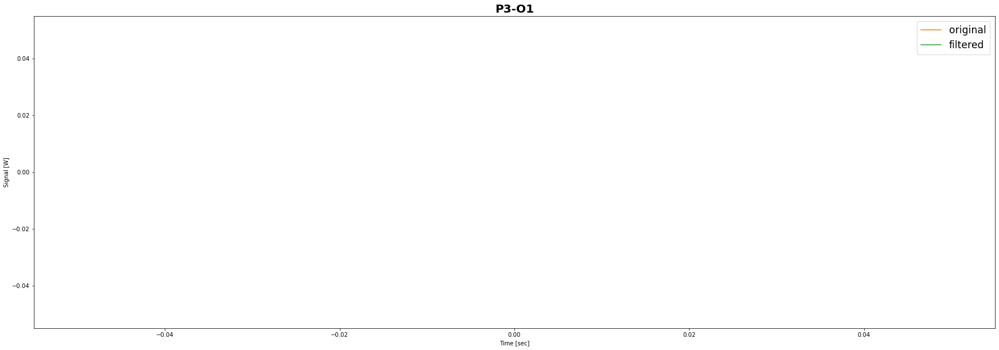

time length 48640


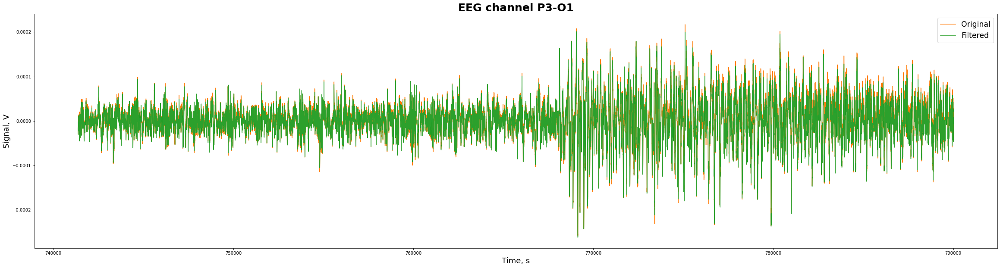

Filtered min and max -0.0005251104640383781 0.00046670495995305094
Original min and max -0.0005362637362637362 0.00045147741147741143


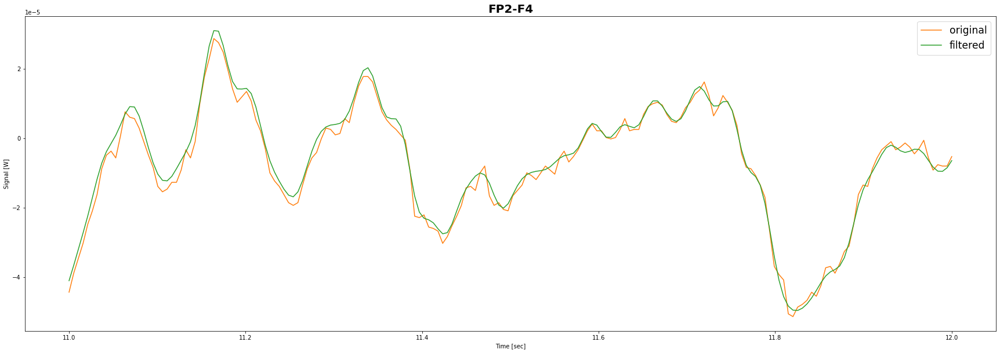

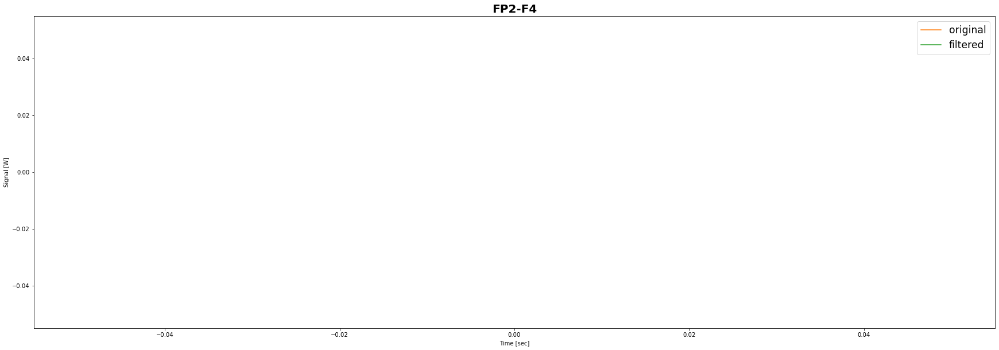

time length 48640


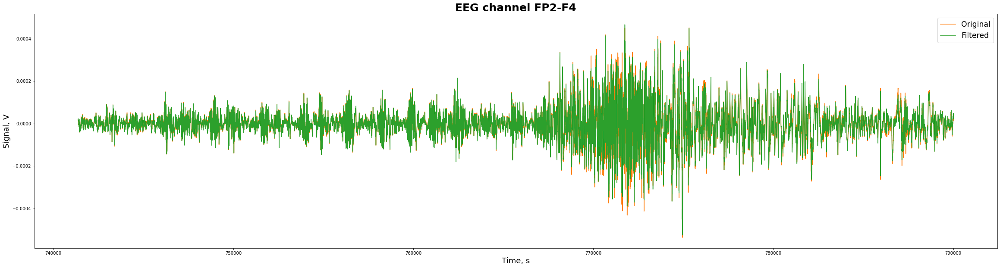

Filtered min and max -0.0005513079187864308 0.00039060852953013716
Original min and max -0.0005542368742368741 0.0003952136752136752


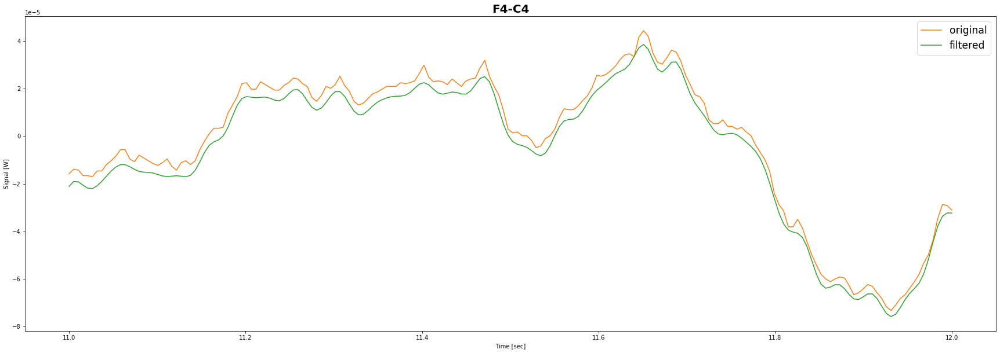

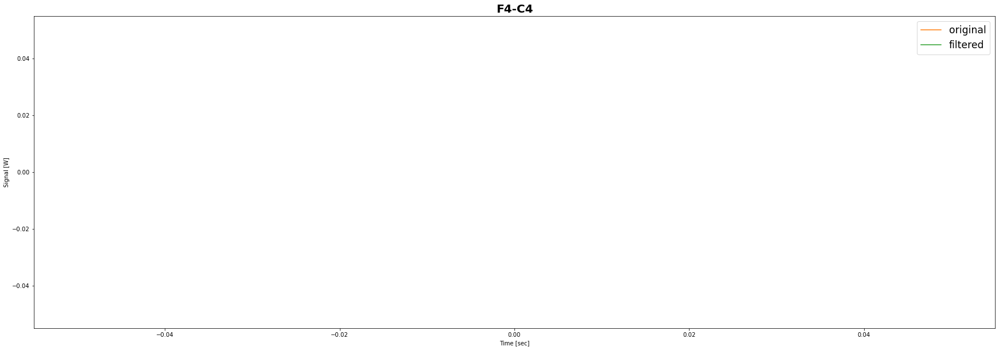

time length 48640


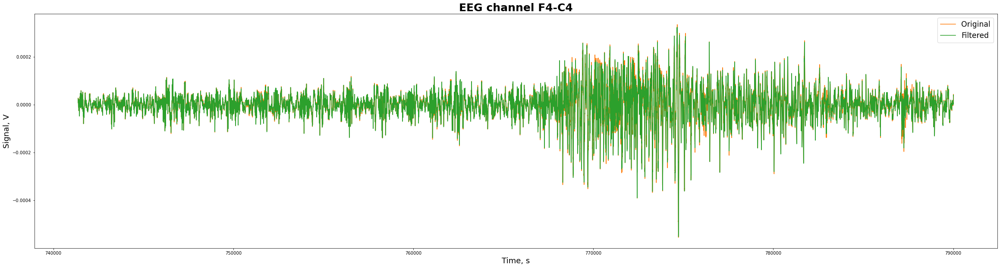

Filtered min and max -0.0003848270848362675 0.00036861660196646056
Original min and max -0.0003905250305250305 0.0003655189255189255


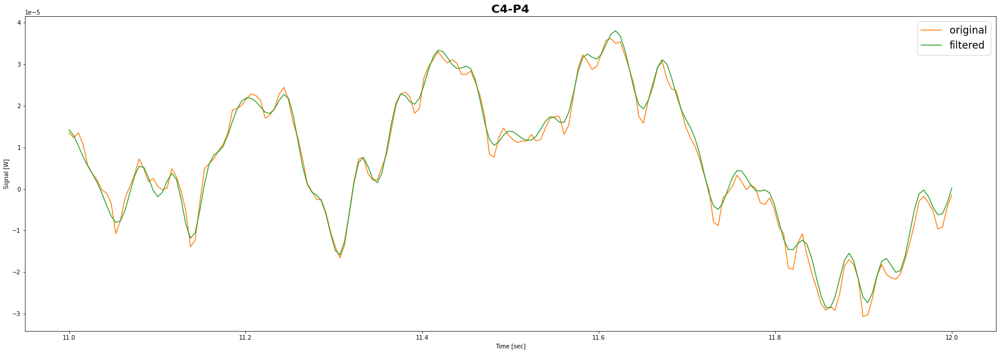

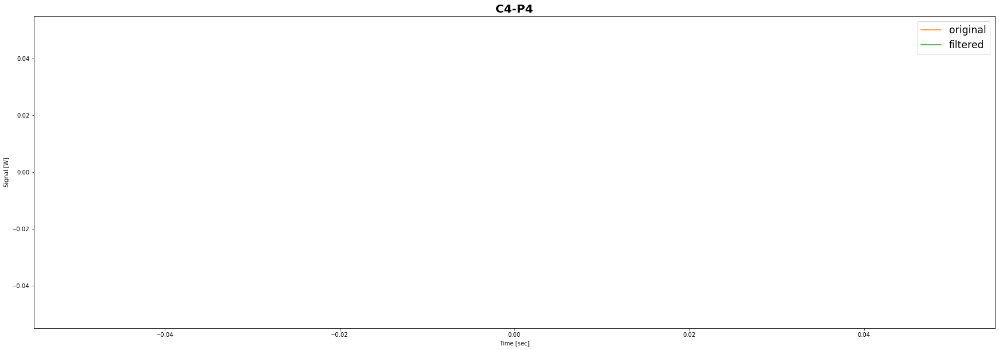

time length 48640


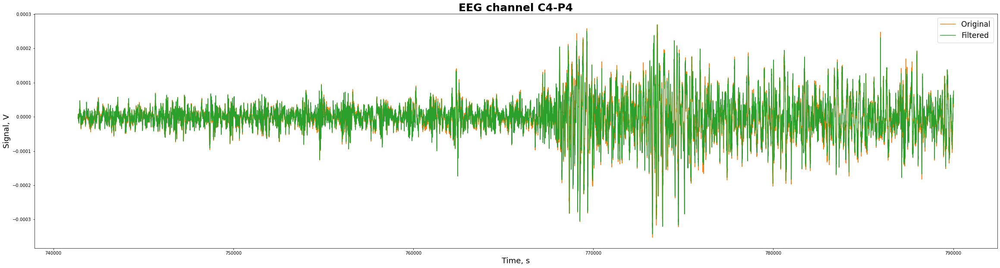

Filtered min and max -0.0003642977379663901 0.0003278780725177642
Original min and max -0.0003862271062271062 0.00032136752136752134


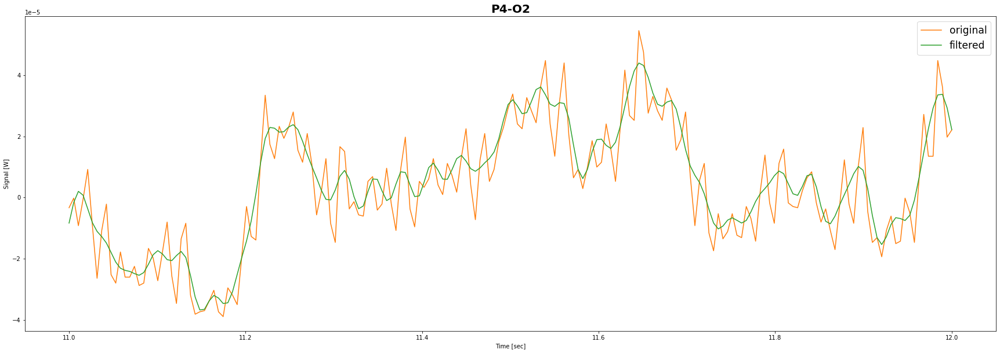

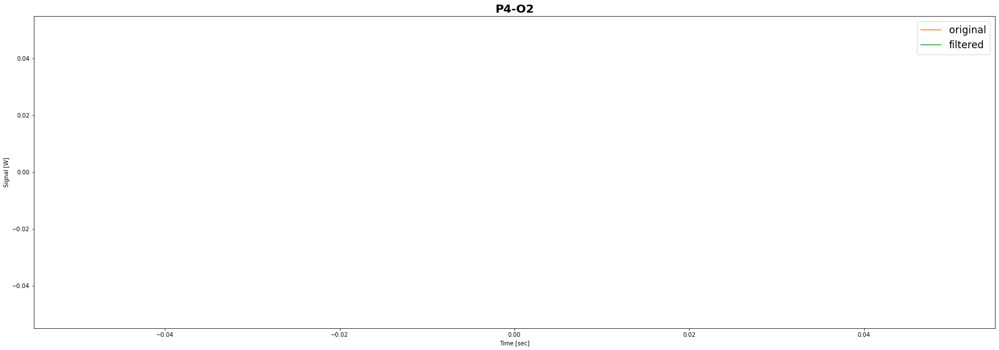

time length 48640


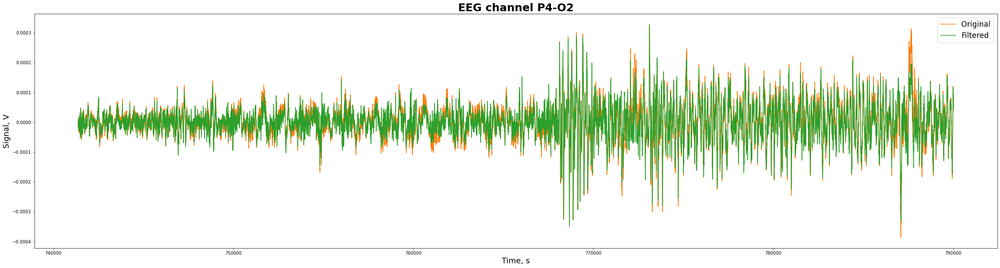

Filtered min and max -0.00046750899663655025 0.00041596313153192716
Original min and max -0.000469059829059829 0.0004452258852258852


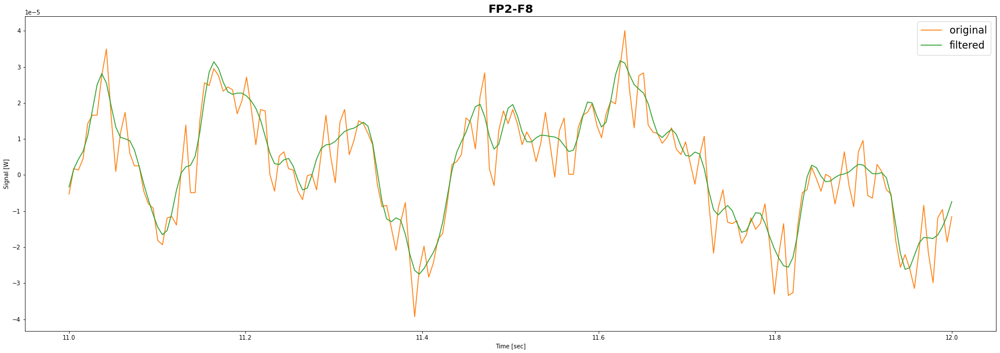

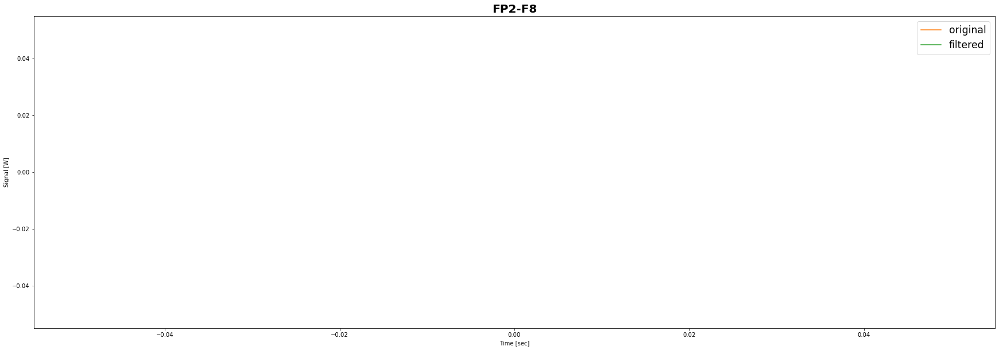

time length 48640


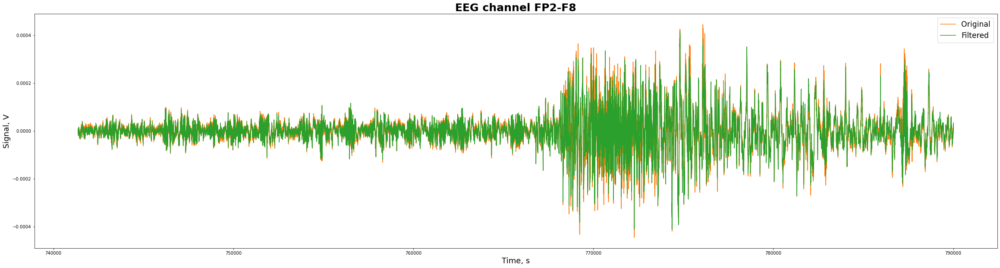

Filtered min and max -0.0004885015677227366 0.0004138403693581225
Original min and max -0.0005472039072039072 0.0004819536019536019


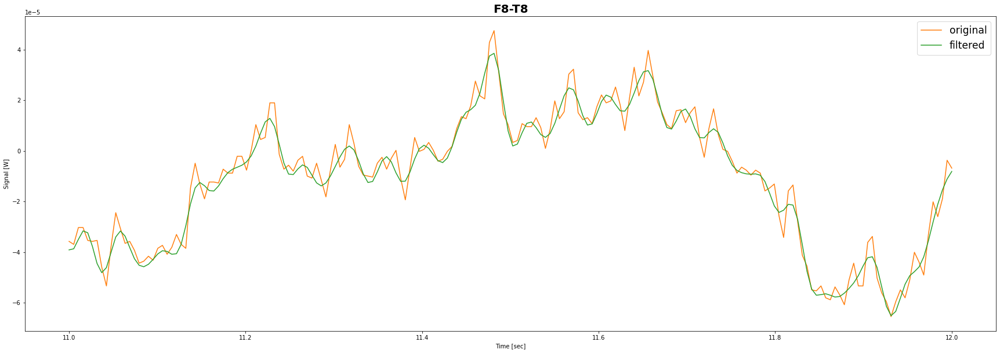

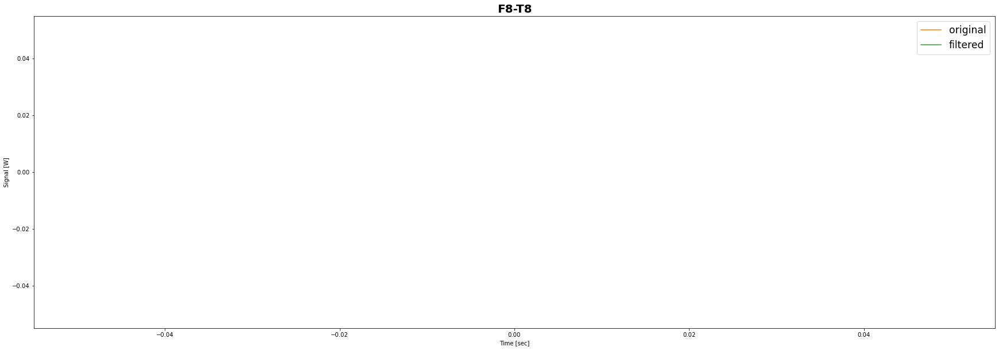

time length 48640


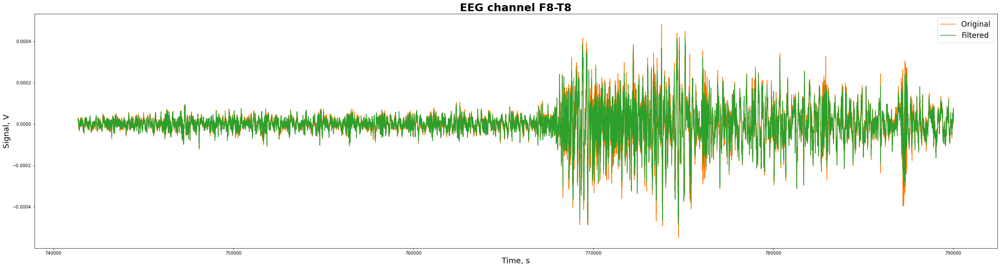

Filtered min and max -0.0007106575446997948 0.0004474461898891042
Original min and max -0.0007210744810744811 0.0004764835164835165


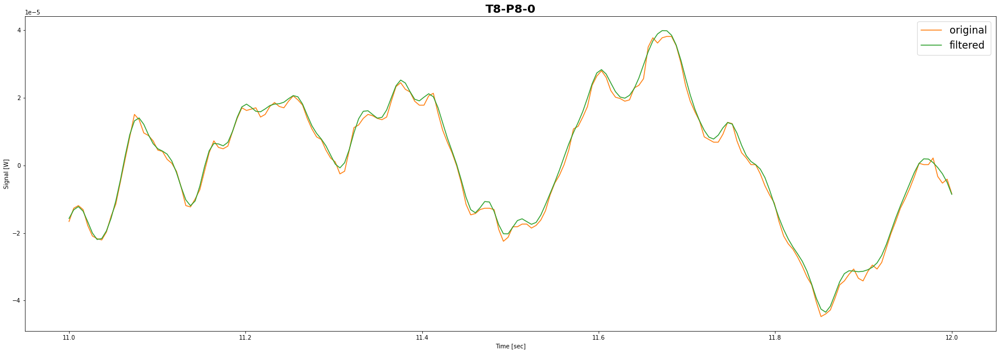

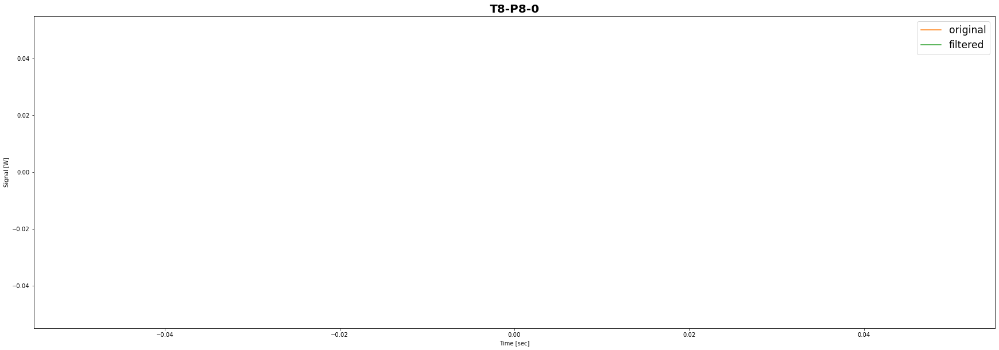

time length 48640


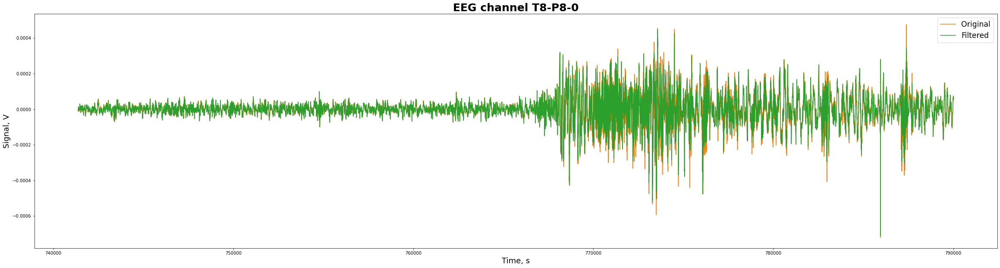

Filtered min and max -0.00036662588911085393 0.00046947712852113454
Original min and max -0.0003784126984126984 0.0004796092796092796


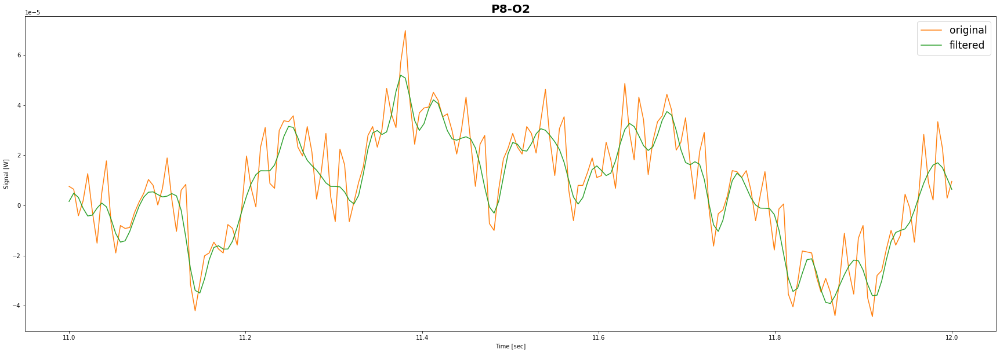

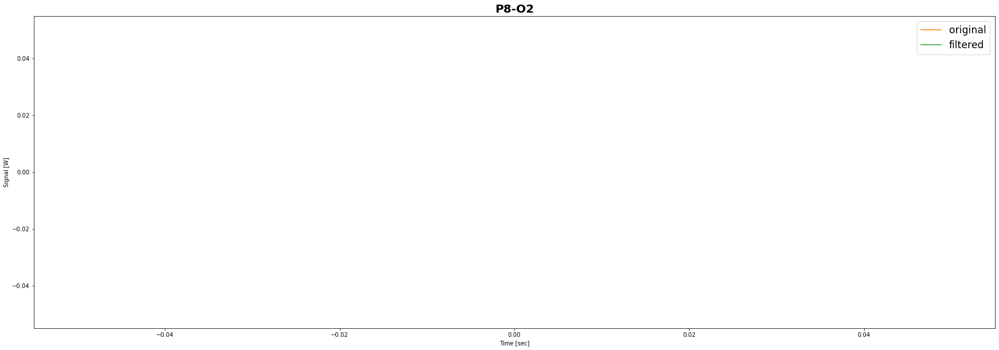

time length 48640


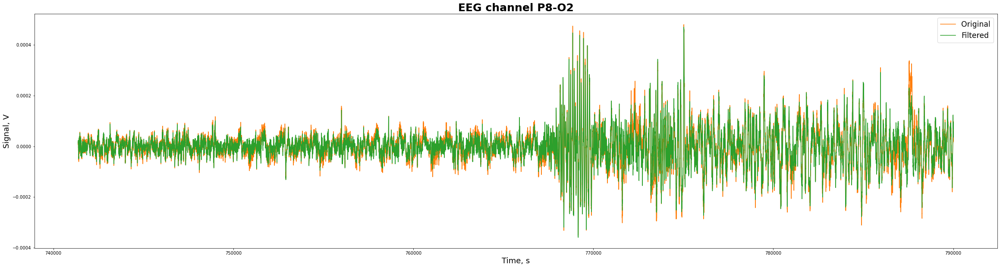

Filtered min and max -0.0005356379837180725 0.0005936360717659606
Original min and max -0.0005401709401709402 0.0005952625152625153


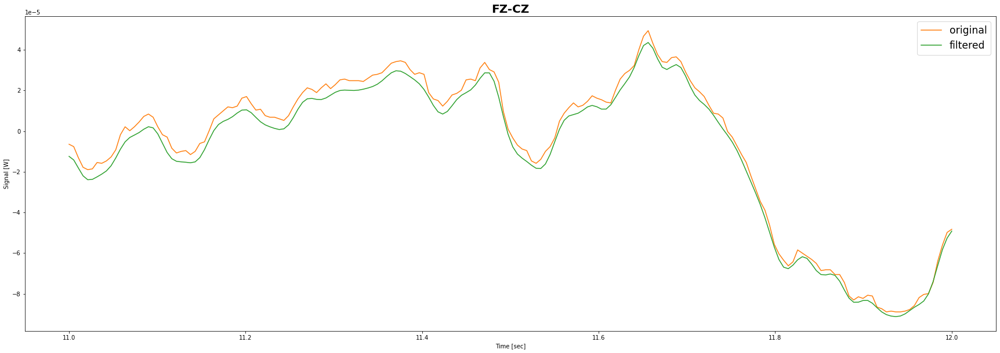

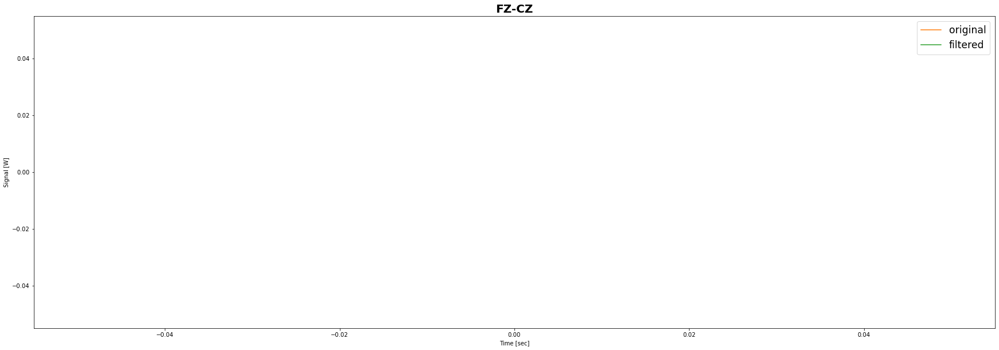

time length 48640


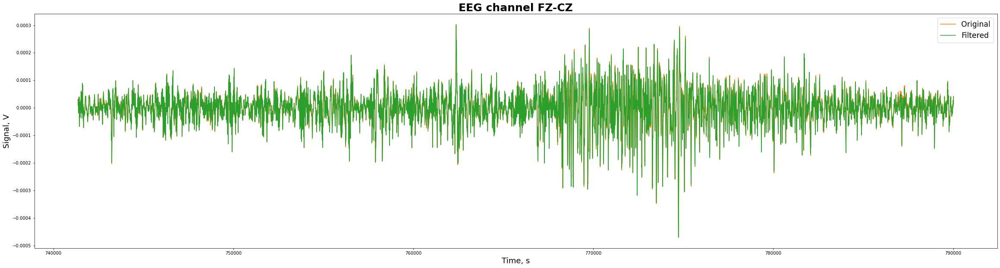

Filtered min and max -0.0004986358316302886 0.00046222618076516145
Original min and max -0.0004917216117216117 0.0004694505494505494


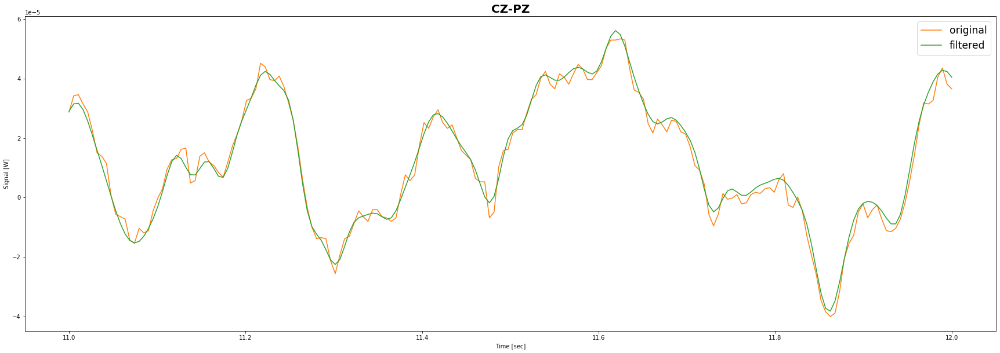

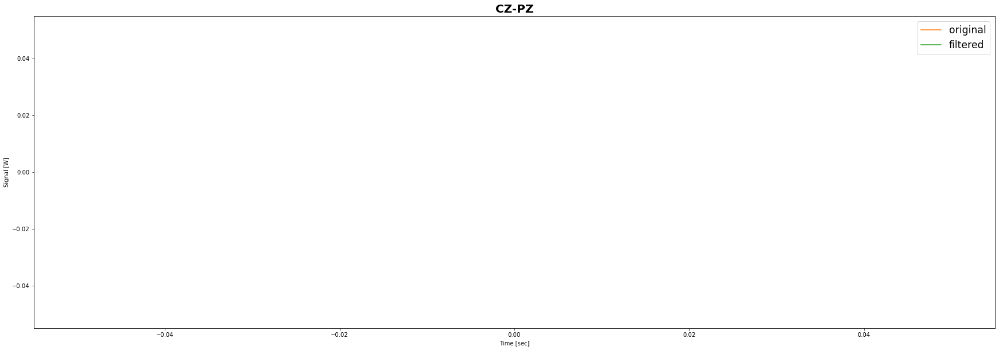

time length 48640


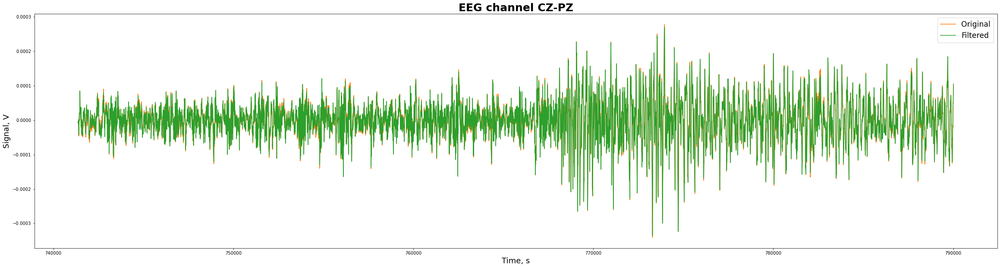

Filtered min and max -0.0003009900257730391 0.00031144027900938896
Original min and max -0.00030925518925518924 0.0003143345543345543


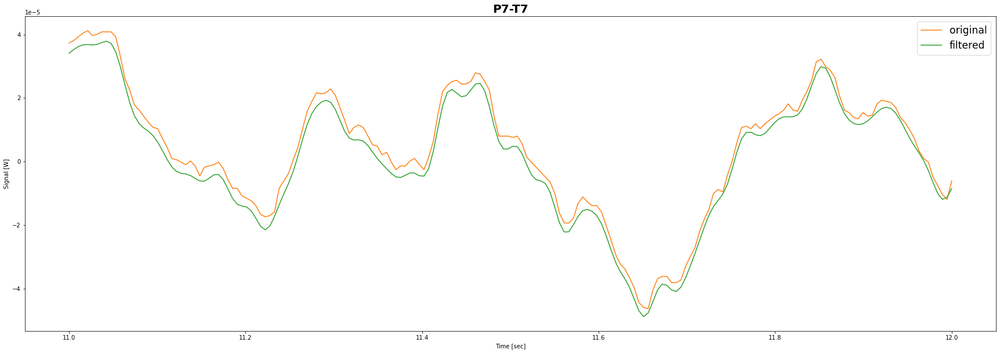

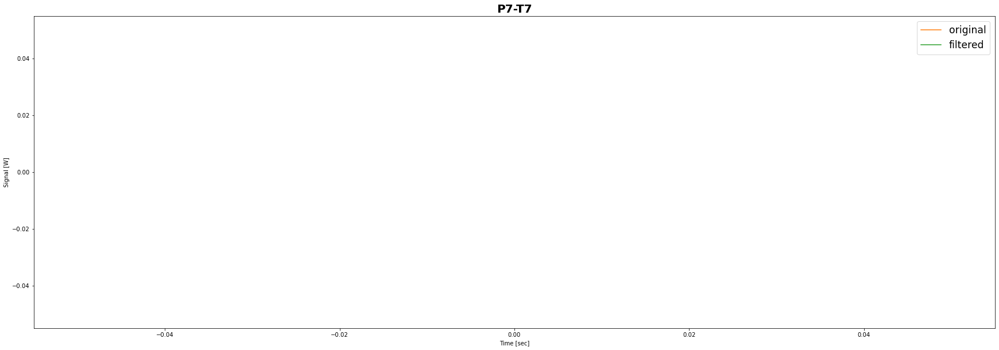

time length 48640


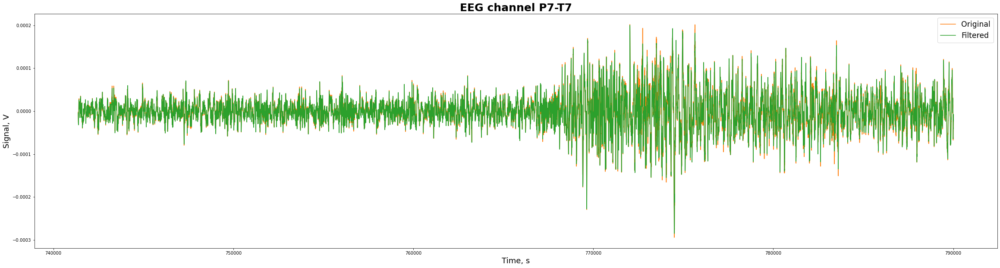

Filtered min and max -0.00019625708798941965 0.00020662264422391957
Original min and max -0.000226031746031746 0.00031706959706959706


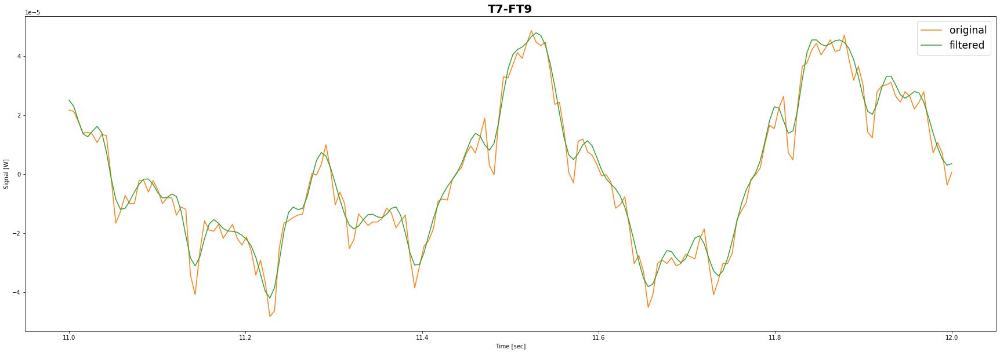

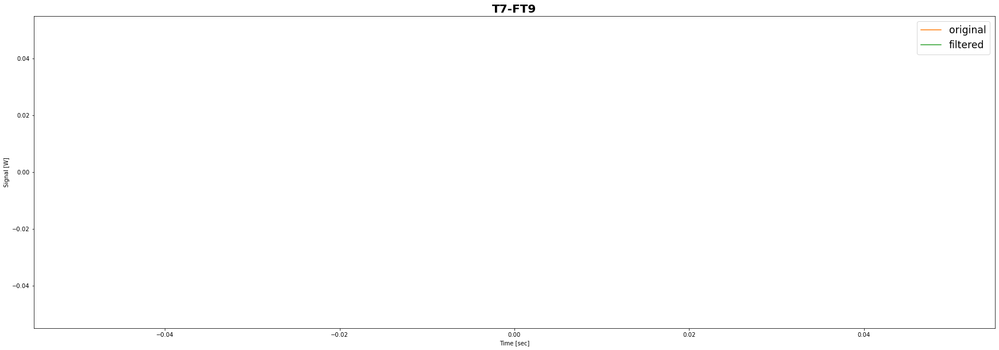

time length 48640


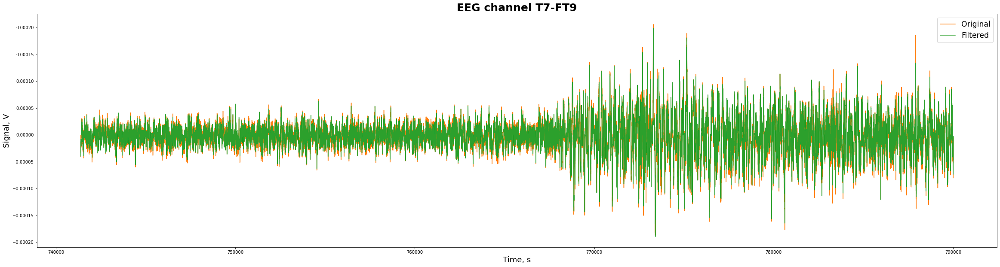

Filtered min and max -0.0005111831959153934 0.00047749508260879506
Original min and max -0.0005124297924297924 0.00048547008547008543


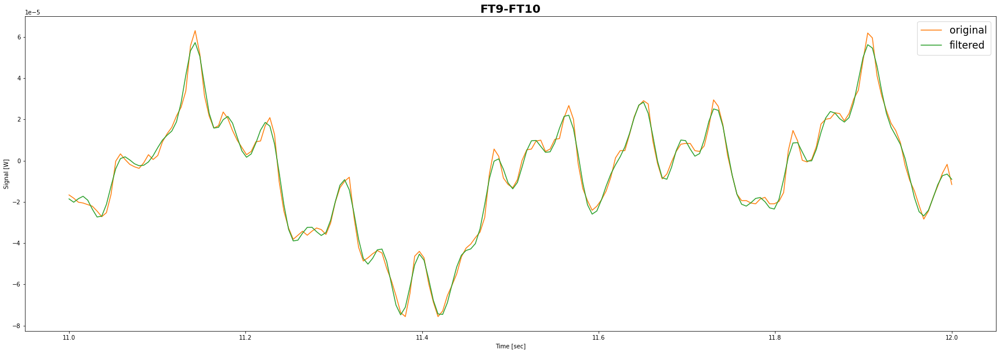

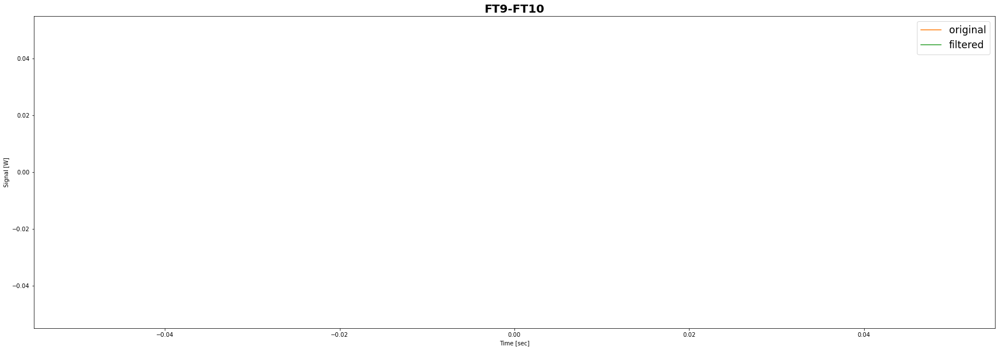

time length 48640


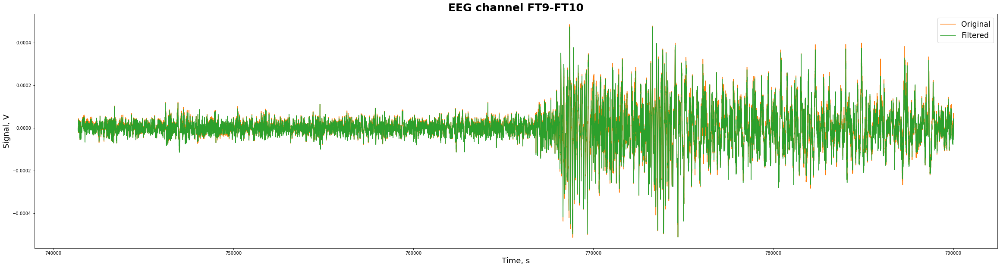

Filtered min and max -0.00025292446171019196 0.0004944007831504242
Original min and max -0.00028932844932844933 0.0005003174603174603


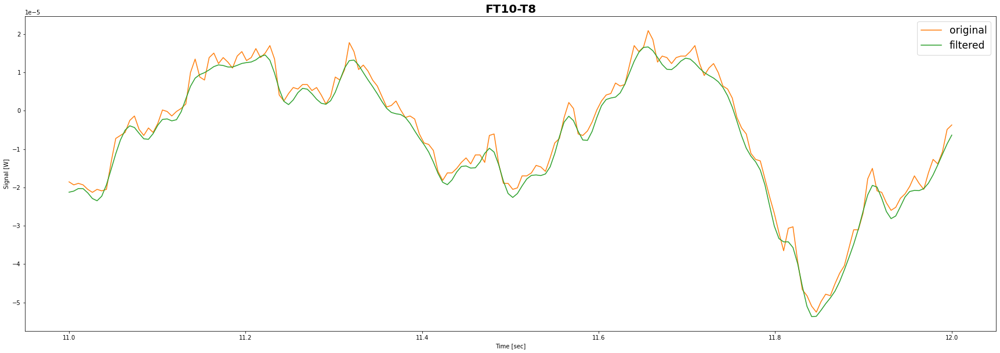

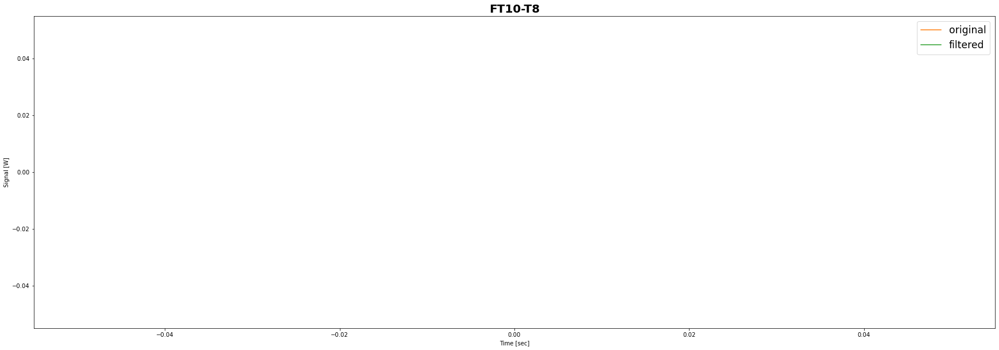

time length 48640


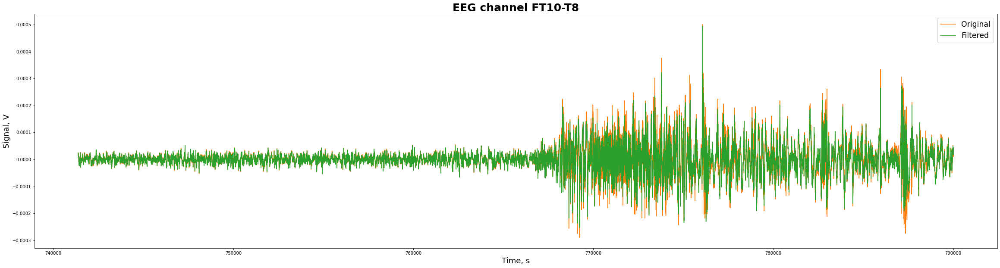

Filtered min and max -0.0007106575446997948 0.0004474461898891042
Original min and max -0.0007210744810744811 0.0004764835164835165


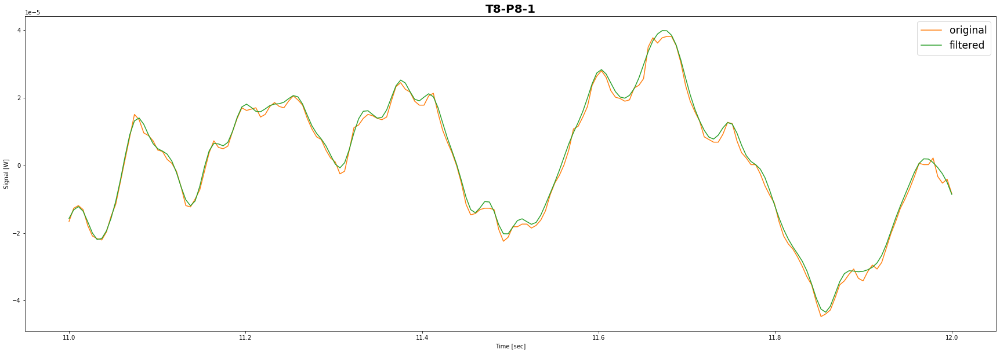

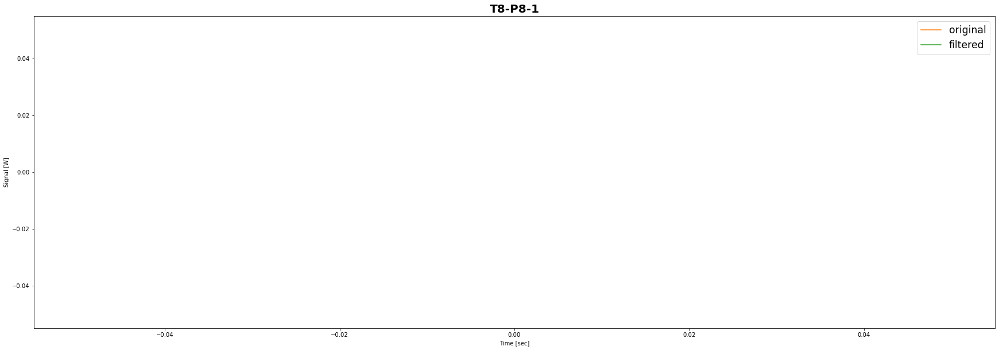

time length 48640


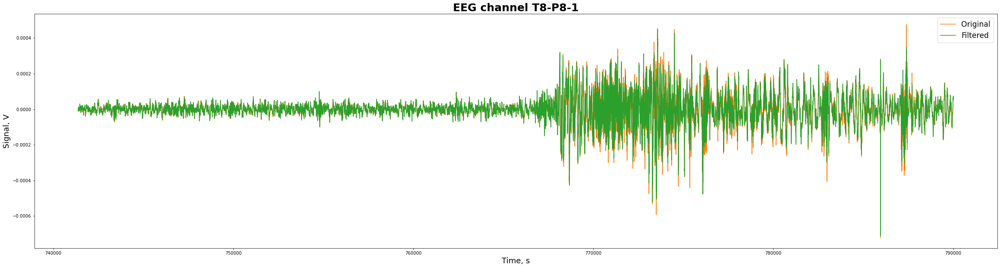

In [60]:
def plot_signal(signal_, filtered, from_, to_, name):
    s = signal_[from_:to_]
    f = filtered[from_:to_]
    time = np.linspace(from_//256, to_//256, len(s))
    
    fig= plt.figure(figsize=(30,10))
    plt.plot(time, s, COLORS[1], label='original')
    plt.plot(time, f, COLORS[2], label='filtered')
    plt.ylabel('Signal [W]')
    plt.xlabel('Time [sec]')
    plt.title(name, weight='bold', fontsize=20)
    plt.legend(fontsize='xx-large')
    plt.show()
def plot_signal_in_time(signal_, filtered, from_, to_, name):
    '''
    Plots an EEG signal for only n_channels sources.
    :param time: int, sec of signal to plot
    :param n_channels: int
    :return: None
    '''
    signal_len = to_-from_
    time_ = np.linspace(from_, to_, signal_len)
    print("time length", len(time_))
    fig = plt.figure(figsize=(40, 10))
    start = from_*256
    stop = from_*256
#     signal_ = signal_.tolist()
#     print("Signal length", type(signal_),len(signal_),signal_)
    plt.plot(time_, signal_, COLORS[1], label='Original')
    plt.plot(time_, filtered, COLORS[2], label='Filtered')
    plt.title('EEG channel '+name, weight='bold', fontsize=25)

    plt.xlabel('Time, s', fontsize=18)
    plt.ylabel('Signal, V', fontsize=18)
    plt.legend(fontsize='xx-large')
        
    plt.show()
    
    
for i in range(copy_of_data.shape[0]):
    print("Filtered min and max",min(copy_of_data[i]), max(copy_of_data[i]))
    print("Original min and max",min(sample.raw_data[i]), max(sample.raw_data[i]))
    plot_signal(sample.raw_data[i], copy_of_data[i], sample.seizure_time[0] - sample.window_before, sample.seizure_time[1] + sample.window_after, sample.channels[i])
    plot_signal(sample.raw_data[i], copy_of_data[i], 0, len(copy_of_data)//256, sample.channels[i])
    f = (sample.seizure_time[0] - sample.window_before)*256
    t = (sample.seizure_time[1] + sample.window_after)*256
    plot_signal_in_time(sample.raw_data[i][f:t], copy_of_data[i][f:t], f, t, sample.channels[i])
    
    
    

PE in filtered signal